## Projet 7 : Implémenter un modèle de scoring

#### Importing libraries

In [1]:
import feature_engine
import imblearn
import joblib
import lightgbm as lgb
import matplotlib.pyplot as plt
import mlflow
import mlflow.sklearn
import numpy as np
import os
import pandas as pd
import seaborn as sns
import warnings

from feature_engine.selection import ProbeFeatureSelection
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from lime import lime_tabular
from mlflow.models.signature import infer_signature
from scipy.special import expit
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, confusion_matrix, f1_score, fbeta_score, make_scorer, roc_auc_score, roc_curve)
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, StratifiedKFold, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, PolynomialFeatures

In [17]:
# Définir l'URI du serveur MLflow
mlflow.set_tracking_uri('http://127.0.0.1:5000') # L'interface utilisateur de MLflow est accessible via à cette adresse

In [228]:
mlflow.set_experiment("/check-localhost-connection")

2024/07/11 16:58:49 INFO mlflow.tracking.fluent: Experiment with name '/check-localhost-connection' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/608464921549720626', creation_time=1720709929673, experiment_id='608464921549720626', last_update_time=1720709929673, lifecycle_stage='active', name='/check-localhost-connection', tags={}>

In [2]:
print(mlflow.__version__)

2.14.1


In [3]:
# List of available datasets
print(os.listdir("C:/Users/guill/Imane/P7/data/"))

['application_test.csv', 'application_train.csv', 'bureau.csv', 'bureau_balance.csv', 'credit_card_balance.csv', 'HomeCredit_columns_description.csv', 'installments_payments.csv', 'P7_20juin2024.ipynb', 'POS_CASH_balance.csv', 'previous_application.csv', 'sample_submission.csv']


There are a total of 9 files: 1 main file for training (with target) 1 main file for testing (without the target), 1 example submission file, and 6 other files containing additional information about each loan.

## 1. Exploratory Data Analysis

Utilisation d'un notebook Kaggle : https://www.kaggle.com/code/willkoehrsen/start-here-a-gentle-introduction/notebook

#### Loading datasets

In [11]:
# Training data
app_train = pd.read_csv("C:/Users/guill/Imane/P7/data/application_train.csv")
print("Training data shape : ", app_train.shape)
app_train.head()

Training data shape :  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


The training data has 307511 observations (each one a separate loan) and 122 features (variables) including the TARGET (the label we want to predict) 0: the loan was repaid or 1: the loan was not repaid.

In [12]:
# Testing data
app_test = pd.read_csv("C:/Users/guill/Imane/P7/data/application_test.csv")
print("Testing data shape : ", app_test.shape)
app_test.head()

Testing data shape :  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


The test set is considerably smaller and lacks a TARGET column.

#### Variables description

In [6]:
description = pd.read_csv('C:/Users/guill/Imane/P7/data/HomeCredit_columns_description.csv', encoding='latin1')

In [7]:
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.max_rows', None)  # Display all rows
pd.set_option('display.max_colwidth', None)  # Display the full width of each column

In [8]:
# Select the name of a variable
description[description['Row'] == 'DAYS_EMPLOYED']

,Unnamed: 0,Table,Row,Description,Special
18,21,application_{train|test}.csv,DAYS_EMPLOYED,How many days before the application the person started current employment,time only relative to the application


#### Examine the Distribution of the Target Column
The target is what we are asked to predict: either a 0 for the loan was repaid on time, or a 1 indicating the client had payment difficulties. We can first examine the number of loans falling into each category.

In [14]:
app_train['TARGET'].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

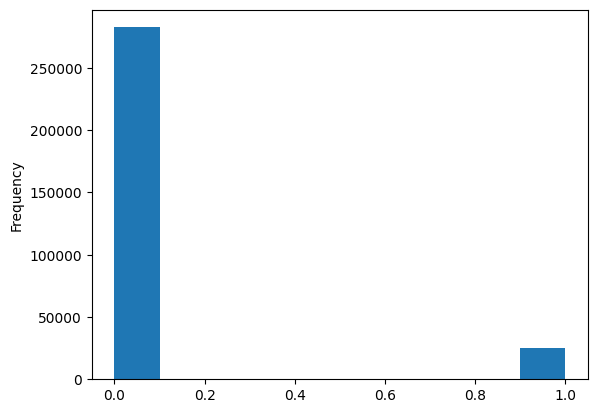

In [17]:
app_train['TARGET'].astype(int).plot.hist();

From this information, we see this is an imbalanced class problem. There are far more loans that were repaid on time than loans that were not repaid. Once we get into more sophisticated machine learning models, we can weight the classes by their representation in the data to reflect this imbalance.

#### Examine Missing Values

Next we can look at the number and percentage of missing values in each column.

In [20]:
# Function to calculate missing values by column

def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * mis_val / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [21]:
# Missing values statistics
missing_values = missing_values_table(app_train)
missing_values.head(20)

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


When it comes time to build our machine learning models, we will have to fill in these missing values (known as imputation). In later work, we will use models such as XGBoost that can handle missing values with no need for imputation. Another option would be to drop columns with a high percentage of missing values, although it is impossible to know ahead of time if these columns will be helpful to our model. Therefore, we will keep all of the columns for now.

#### Column Types

In [24]:
# Number of each type of column
app_train.dtypes.value_counts()

float64    65
int64      41
object     16
Name: count, dtype: int64

Let's now look at the number of unique entries in each of the object (categorical) columns.

In [27]:
# Number of unique classes in each object column
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

Most of the categorical variables have a relatively small number of unique entries. We will need to find a way to deal with these categorical variables!

#### Encoding Categorical Variables

Before we go any further, we need to deal with pesky categorical variables. A machine learning model unfortunately cannot deal with categorical variables (except for some models such as LightGBM). Therefore, we have to find a way to encode (represent) these variables as numbers before handing them off to the model. There are two main ways to carry out this process:

1) Label encoding: assign each unique category in a categorical variable with an integer. No new columns are created.

2) One-hot encoding: create a new column for each unique category in a categorical variable. Each observation receives a 1 in the column for its corresponding category and a 0 in all other new columns.

The problem with label encoding is that it gives the categories an arbitrary ordering. The value assigned to each of the categories is random and does not reflect any inherent aspect of the category. If we only have two unique values for a categorical variable (such as Male/Female), then label encoding is fine, but for more than 2 unique categories, one-hot encoding is the safe option.

The only downside to one-hot encoding is that the number of features (dimensions of the data) can explode with categorical variables with many categories. To deal with this, we can perform one-hot encoding followed by PCA or other dimensionality reduction methods to reduce the number of dimensions (while still trying to preserve information).

#### Label Encoding and One-Hot Encoding¶

For any categorical variable with 2 unique categories, we will use **label encoding**, and for any categorical variable with more than 2 unique categories, we will use **one-hot encoding**.

In [13]:
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in app_train:
    if app_train[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(app_train[col].unique())) <= 2:
            # Train on the training data
            le.fit(app_train[col])
            # Transform both training and testing data
            app_train[col] = le.transform(app_train[col])
            app_test[col] = le.transform(app_test[col])
            
            # Keep track of how many columns were label encoded
            le_count += 1
            
print('%d columns were label encoded.' % le_count)
# d dans '%d' signifie que vous allez insérer un entier (digit) dans cette position dans la chaîne de caractères.

3 columns were label encoded.


In [14]:
# One-hot encoding of categorical variables
app_train = pd.get_dummies(app_train)
app_test = pd.get_dummies(app_test)

print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 243)
Testing Features shape:  (48744, 239)


#### Aligning Training and Testing Data

There need to be the same features (columns) in both the training and testing data. One-hot encoding has created more columns in the training data because there were some categorical variables with categories not represented in the testing data. To remove the columns in the training data that are not in the testing data, we need to align the dataframes. First we extract the target column from the training data (because this is not in the testing data but we need to keep this information). When we do the align, we must make sure to set axis = 1 to align the dataframes based on the columns and not on the rows!

In [15]:
train_labels = app_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
app_train, app_test = app_train.align(app_test, join = 'inner', axis = 1)

# Add the target back in
app_train['TARGET'] = train_labels

print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 240)
Testing Features shape:  (48744, 239)


The training and testing datasets now have the same features which is required for machine learning. The number of features has grown significantly due to one-hot encoding. 

#### Anomalies

One problem we always want to be on the lookout for when doing EDA is anomalies within the data. These may be due to mis-typed numbers, errors in measuring equipment, or they could be valid but extreme measurements. One way to support anomalies quantitatively is by looking at the statistics of a column using the describe method. The numbers in the DAYS_BIRTH column are negative because they are recorded relative to the current loan application. To see these stats in years, we can mutliple by -1 and divide by the number of days in a year:

In [40]:
app_train['DAYS_BIRTH'].head(25)

0     -9461
1    -16765
2    -19046
3    -19005
4    -19932
5    -16941
6    -13778
7    -18850
8    -20099
9    -14469
10   -10197
11   -20417
12   -13439
13   -14086
14   -14583
15    -8728
16   -12931
17    -9776
18   -17718
19   -11348
20   -18252
21   -14815
22   -11146
23   -24827
24   -11286
Name: DAYS_BIRTH, dtype: int64

In [41]:
(app_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

Those ages look reasonable. There are no outliers for the age on either the high or low end. How about the days of employment?

In [42]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [44]:
365243/365

# That doesn't look right! The maximum value (besides being positive) is about 1000 years!

1000.6657534246575

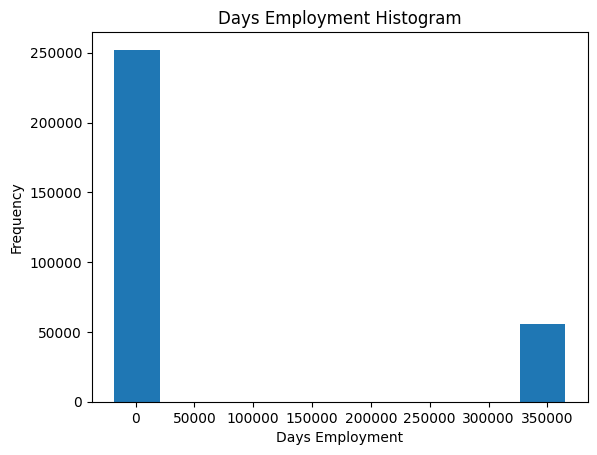

In [45]:
app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

Just out of curiousity, let's subset the anomalous clients and see if they tend to have higher or low rates of default than the rest of the clients.

In [53]:
anom = app_train[app_train['DAYS_EMPLOYED'] == 365243]
non_anom = app_train[app_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

# le symbole % est utilisé pour indiquer qu'une valeur sera insérée dans la chaîne de caractères.
# "0.2f" spécifie le format de la valeur numérique à insérer.

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


It turns out that the anomalies have a lower rate of default.

Handling the anomalies depends on the exact situation, with no set rules. One of the safest approaches is just to set the anomalies to a missing value and then have them filled in (using Imputation) before machine learning. In this case, since all the anomalies have the exact same value, we want to fill them in with the same value in case all of these loans share something in common. The anomalous values seem to have some importance, so we want to tell the machine learning model if we did in fact fill in these values. As a solution, we will fill in the anomalous values with not a number (np.nan) and then create a new boolean column indicating whether or not the value was anomalous.

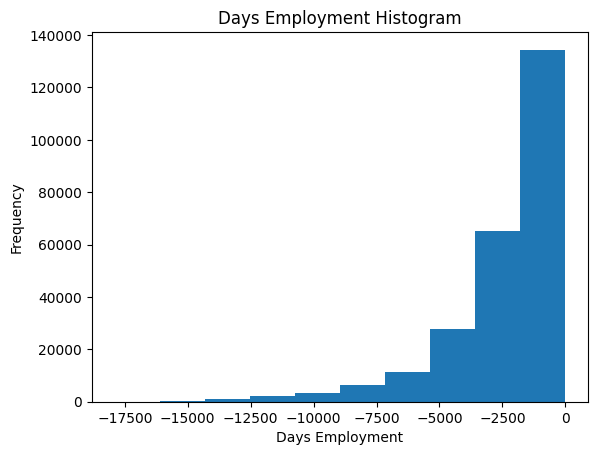

In [56]:
# Create an anomalous flag column
app_train['DAYS_EMPLOYED_ANOM'] = app_train["DAYS_EMPLOYED"] == 365243 # Colonne TRUE / FALSE

# Replace the anomalous values with nan
app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

The distribution looks to be much more in line with what we would expect, and we also have created a new column to tell the model that these values were originally anomalous (because we will have to fill in the nans with some value, probably the median of the column). The other columns with DAYS in the dataframe look to be about what we expect with no obvious outliers.

As an extremely important note, anything we do to the training data we also have to do to the testing data. Let's make sure to create the new column and fill in the existing column with np.nan in the testing data.

In [57]:
app_test['DAYS_EMPLOYED_ANOM'] = app_test["DAYS_EMPLOYED"] == 365243
app_test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print('There are %d anomalies in the test data out of %d entries' % (app_test["DAYS_EMPLOYED_ANOM"].sum(), len(app_test)))

There are 9274 anomalies in the test data out of 48744 entries


#### Correlations

Now that we have dealt with the categorical variables and the outliers, let's continue with the EDA. One way to try and understand the data is by looking for correlations between the features and the target. We can calculate the Pearson correlation coefficient between every variable and the target using the .corr dataframe method.

The correlation coefficient is not the greatest method to represent "relevance" of a feature, but it does give us an idea of possible relationships within the data.

In [58]:
# Find correlations with the target and sort
correlations = app_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 OCCUPATION_TYPE_Laborers                             0.043019
FLAG_DOCUMENT_3                                      0.044346
REG_CITY_NOT_LIVE_CITY                               0.044395
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
REG_CITY_NOT_WORK_CITY                               0.050994
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
DAYS_LAST_PHONE_CHANGE                               0.055218
NAME_INCOME_TYPE_Working                             0.057481
REGION_RATING_CLIENT                                 0.058899
REGION_RATING_CLIENT_W_CITY                          0.060893
DAYS_EMPLOYED                                        0.074958
DAYS_BIRTH                                           0.078239
TARGET                                               1.000000
Name: TARGET, dtype: float64

Most Negati

Let's take a look at some of more significant correlations: the DAYS_BIRTH is the most positive correlation. DAYS_BIRTH is the age in days of the client at the time of the loan in negative days (for whatever reason!). The correlation is positive, but the value of this feature is actually negative, meaning that as the client gets older, they are less likely to default on their loan (ie the target == 0). That's a little confusing, so we will take the absolute value of the feature and then the correlation will be negative.

#### Effect of Age on Repayment

In [59]:
# Find the correlation of the positive days 
app_train['DAYS_BIRTH'] = abs(app_train['DAYS_BIRTH'])
app_train['DAYS_BIRTH'].corr(app_train['TARGET'])

-0.07823930830982709

As the client gets older, there is a negative linear relationship with the target meaning that as clients get older, they tend to repay their loans on time more often.

Let's start looking at this variable. First, we can make a histogram of the age. We will put the x axis in years to make the plot a little more understandable.

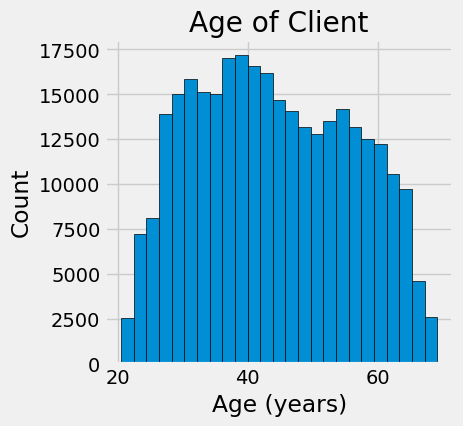

In [75]:
plt.figure(figsize = (4, 4))

# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(app_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

By itself, the distribution of age does not tell us much other than that there are no outliers as all the ages are reasonable. To visualize the effect of the age on the target, we will next make a kernel density estimation plot (KDE) colored by the value of the target. A kernel density estimate plot shows the distribution of a single variable and can be thought of as a smoothed histogram (it is created by computing a kernel, usually a Gaussian, at each data point and then averaging all the individual kernels to develop a single smooth curve). 

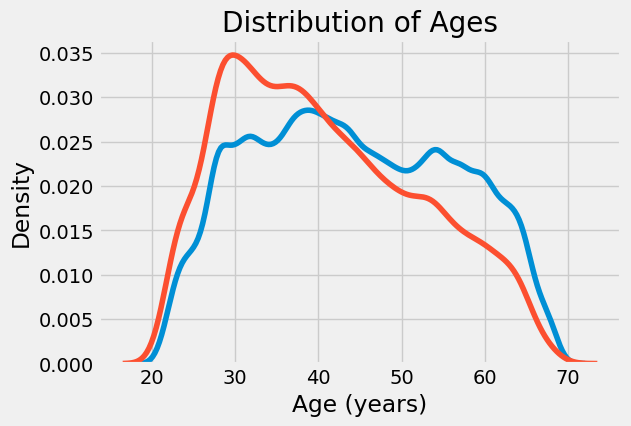

In [73]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

The target == 1 curve skews towards the younger end of the range. Although this is not a significant correlation (-0.07 correlation coefficient), this variable is likely going to be useful in a machine learning model because it does affect the target. Let's look at this relationship in another way: average failure to repay loans by age bracket.

To make this graph, first we cut the age category into bins of 5 years each. Then, for each bin, we calculate the average value of the target, which tells us the ratio of loans that were not repaid in each age category.

In [76]:
# Age information into a separate dataframe
age_data = app_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [77]:
# Group by the bin and calculate averages
age_groups = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


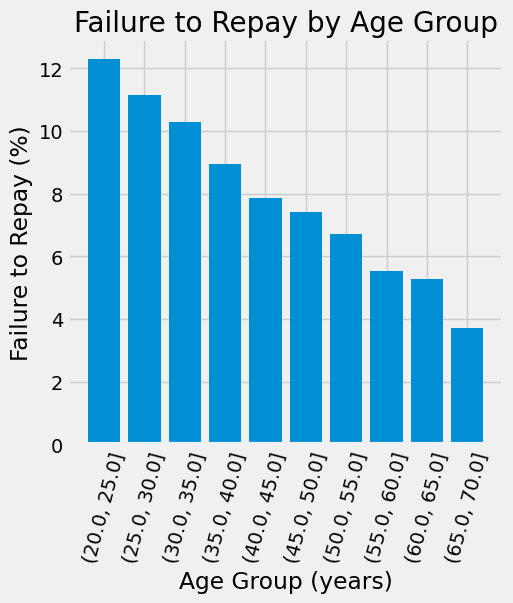

In [79]:
plt.figure(figsize = (5, 5))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

There is a clear trend: younger applicants are more likely to not repay the loan! The rate of failure to repay is above 10% for the youngest three age groups and beolow 5% for the oldest age group.

This is information that could be directly used by the bank: because younger clients are less likely to repay the loan, maybe they should be provided with more guidance or financial planning tips. This does not mean the bank should discriminate against younger clients, but it would be smart to take precautionary measures to help younger clients pay on time.

#### Exterior Sources

The 3 variables with the strongest negative correlations with the target are EXT_SOURCE_1, EXT_SOURCE_2, and EXT_SOURCE_3. According to the documentation, these features represent a "normalized score from external data source". I'm not sure what this exactly means, but it may be a cumulative sort of credit rating made using numerous sources of data.

Let's take a look at these variables.

First, we can show the correlations of the EXT_SOURCE features with the target and with each other.

In [80]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = app_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160472,-0.178919,-0.078239
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,0.600610
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,0.091996
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,0.205478
DAYS_BIRTH,-0.078239,0.600610,0.091996,0.205478,1.000000


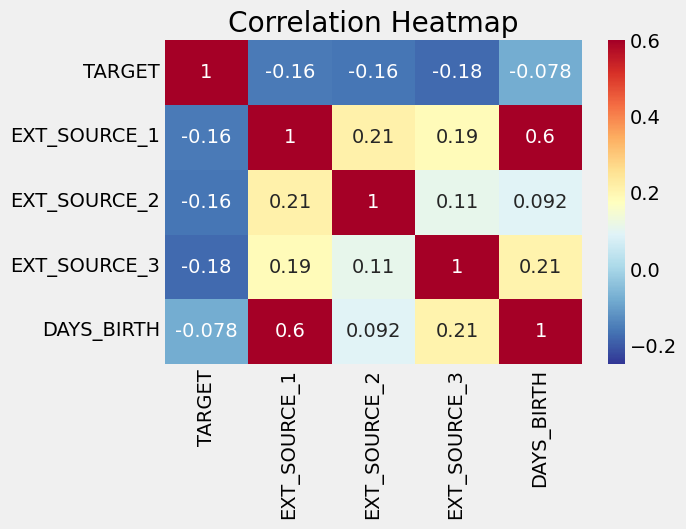

In [82]:
plt.figure(figsize = (6, 4))

# Heatmap of correlations
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

All three EXT_SOURCE features have negative correlations with the target, indicating that as the value of the EXT_SOURCE increases, the client is more likely to repay the loan. We can also see that DAYS_BIRTH is positively correlated with EXT_SOURCE_1 indicating that maybe one of the factors in this score is the client age.

Next we can look at the distribution of each of these features colored by the value of the target. This will let us visualize the effect of this variable on the target.

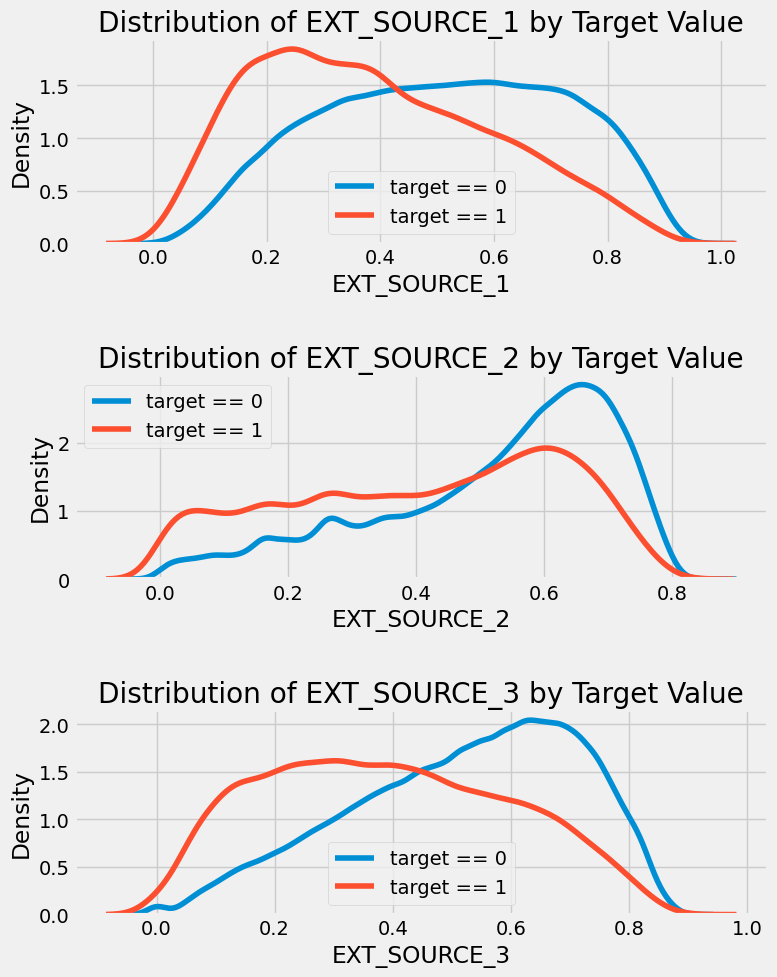

In [89]:
plt.figure(figsize = (8, 10))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    
    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, source], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');
    
    plt.legend()
    
plt.tight_layout(h_pad = 2.5)
plt.show()

EXT_SOURCE_3 displays the greatest difference between the values of the target. We can clearly see that this feature has some relationship to the likelihood of an applicant to repay a loan. The relationship is not very strong (in fact they are all considered very weak, but these variables will still be useful for a machine learning model to predict whether or not an applicant will repay a loan on time.

## 2. Feature Engineering

Feature engineering refers to a geneal process and can involve both feature construction: adding new features from the existing data, and feature selection: choosing only the most important features or other methods of dimensionality reduction. There are many techniques we can use to both create features and select features.

Here we will try simple feature construction and selection methods:
- Polynomial features
- Domain knowledge features
- Feature selection with Probe method

#### Polynomial features

One simple feature construction method is called polynomial features. In this method, we make features that are powers of existing features as well as interaction terms between existing features. For example, we can create variables EXT_SOURCE_1^2 and EXT_SOURCE_2^2 and also variables such as EXT_SOURCE_1 x EXT_SOURCE_2, EXT_SOURCE_1 x EXT_SOURCE_2^2, EXT_SOURCE_1^2 x EXT_SOURCE_2^2, and so on. These features that are a combination of multiple individual variables are called interaction terms because they capture the interactions between variables. In other words, while two variables by themselves may not have a strong influence on the target, combining them together into a single interaction variable might show a relationship with the target.

In the following code, we create polynomial features using the EXT_SOURCE variables and the DAYS_BIRTH variable. Scikit-Learn has a useful class called PolynomialFeatures that creates the polynomials and the interaction terms up to a specified degree. We can use a degree of 3 to see the results (when we are creating polynomial features, we want to avoid using too high of a degree, both because the number of features scales exponentially with the degree, and because we can run into problems with overfitting).

In [96]:
# Make a new dataframe for polynomial features
poly_features = app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'TARGET']]
poly_features_test = app_test[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]

# Imputer for handling missing values

imputer = SimpleImputer(strategy = 'median')

poly_target = poly_features['TARGET']

poly_features = poly_features.drop(columns = ['TARGET'])

# Need to impute missing values
poly_features = imputer.fit_transform(poly_features)
poly_features_test = imputer.transform(poly_features_test)
                                  
# Create the polynomial object with specified degree
poly_transformer = PolynomialFeatures(degree = 3)

We use "fit_transform" on the training data to fit the imputer and transform the data in one step. Then, we use "transform" on the test data to apply the same transformations, ensuring that the statistics used (such as the median of the columns) are based only on the training data.

In [97]:
poly_features.shape

(307511, 4)

In [98]:
# Train the polynomial features
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)
poly_features_test = poly_transformer.transform(poly_features_test)
print('Polynomial Features shape: ', poly_features.shape)

Polynomial Features shape:  (307511, 35)


This creates a considerable number of new features. To get the names we have to use the polynomial features get_feature_names method.

In [102]:
poly_transformer.get_feature_names_out(input_features = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH'])[:15]

array(['1', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH',
       'EXT_SOURCE_1^2', 'EXT_SOURCE_1 EXT_SOURCE_2',
       'EXT_SOURCE_1 EXT_SOURCE_3', 'EXT_SOURCE_1 DAYS_BIRTH',
       'EXT_SOURCE_2^2', 'EXT_SOURCE_2 EXT_SOURCE_3',
       'EXT_SOURCE_2 DAYS_BIRTH', 'EXT_SOURCE_3^2',
       'EXT_SOURCE_3 DAYS_BIRTH', 'DAYS_BIRTH^2'], dtype=object)

There are 35 features with individual features raised to powers up to degree 3 and interaction terms. Now, we can see whether any of these new features are correlated with the target.

In [104]:
# Create a dataframe of the features 
poly_features = pd.DataFrame(poly_features, 
                             columns = poly_transformer.get_feature_names_out(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                           'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Add in the target
poly_features['TARGET'] = poly_target

# Find the correlations with the target
poly_corrs = poly_features.corr()['TARGET'].sort_values()

# Display most negative and most positive
print(poly_corrs.head(10))
print(" ")
print(poly_corrs.tail(5))

EXT_SOURCE_2 EXT_SOURCE_3                -0.193939
EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3   -0.189605
EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH     -0.181283
EXT_SOURCE_2^2 EXT_SOURCE_3              -0.176428
EXT_SOURCE_2 EXT_SOURCE_3^2              -0.172282
EXT_SOURCE_1 EXT_SOURCE_2                -0.166625
EXT_SOURCE_1 EXT_SOURCE_3                -0.164065
EXT_SOURCE_2                             -0.160295
EXT_SOURCE_2 DAYS_BIRTH                  -0.156873
EXT_SOURCE_1 EXT_SOURCE_2^2              -0.156867
Name: TARGET, dtype: float64
 
DAYS_BIRTH     -0.078239
DAYS_BIRTH^2   -0.076672
DAYS_BIRTH^3   -0.074273
TARGET          1.000000
1                    NaN
Name: TARGET, dtype: float64


Several of the new variables have a greater (in terms of absolute magnitude) correlation with the target than the original features. When we build machine learning models, we can try with and without these features to determine if they actually help the model learn.

We will add these features to a copy of the training and testing data and then evaluate models with and without the features.

In [108]:
# Put test features into dataframe
poly_features_test = pd.DataFrame(poly_features_test, 
                                  columns = poly_transformer.get_feature_names_out(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                                'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Merge polynomial features into training dataframe
poly_features['SK_ID_CURR'] = app_train['SK_ID_CURR']
app_train_poly = app_train.merge(poly_features, on = 'SK_ID_CURR', how = 'left')

# Merge polnomial features into testing dataframe
poly_features_test['SK_ID_CURR'] = app_test['SK_ID_CURR']
app_test_poly = app_test.merge(poly_features_test, on = 'SK_ID_CURR', how = 'left')

# Align the dataframes
app_train_poly, app_test_poly = app_train_poly.align(app_test_poly, join = 'inner', axis = 1)

# Print out the new shapes
print('Training data with polynomial features shape: ', app_train_poly.shape)
print('Testing data with polynomial features shape:  ', app_test_poly.shape)

Training data with polynomial features shape:  (307511, 275)
Testing data with polynomial features shape:   (48744, 275)


In [109]:
# Sauvegarde des df

app_train_poly.to_csv('app_train_poly.csv', index=False)
app_test_poly.to_csv('app_test_poly.csv', index=False)

app_train.to_csv('app_train.csv', index=False)
app_test.to_csv('app_test.csv', index=False)

#### Domain Knowledge Features

We can create a couple features that attempt to capture what we think may be important for telling whether a client will default on a loan.

- CREDIT_INCOME_PERCENT: the percentage of the credit amount relative to a client's income
- ANNUITY_INCOME_PERCENT: the percentage of the loan annuity relative to a client's income
- CREDIT_TERM: the length of the payment in months (since the annuity is the monthly amount due)
- DAYS_EMPLOYED_PERCENT: the percentage of the days employed relative to the client's age

#### On crée un df avec les nouvelles variables polynomiales ET les variables métier créées
##### On ajoute la colonne "DAYS_BIRTH"

In [79]:
col_to_add = app_train['DAYS_BIRTH']
col_to_add_test = app_test['DAYS_BIRTH']

In [80]:
app_train_poly['DAYS_BIRTH'] = col_to_add
app_test_poly['DAYS_BIRTH'] = col_to_add_test

In [85]:
app_test_poly['DAYS_BIRTH'] = col_to_add_test

In [81]:
app_train_domain = app_train_poly.copy()
app_test_domain = app_test_poly.copy()

app_train_domain['CREDIT_INCOME_PERCENT'] = app_train_domain['AMT_CREDIT'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['ANNUITY_INCOME_PERCENT'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['CREDIT_TERM'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_CREDIT']
app_train_domain['DAYS_EMPLOYED_PERCENT'] = app_train_domain['DAYS_EMPLOYED'] / app_train_domain['DAYS_BIRTH']

In [90]:
app_test_domain['CREDIT_INCOME_PERCENT'] = app_test_domain['AMT_CREDIT'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['ANNUITY_INCOME_PERCENT'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['CREDIT_TERM'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_CREDIT']
app_test_domain['DAYS_EMPLOYED_PERCENT'] = app_test_domain['DAYS_EMPLOYED'] / app_test_domain['DAYS_BIRTH']

#### Visualize New Variables
We should explore these domain knowledge variables visually in a graph. For all of these, we will make the same KDE plot colored by the value of the TARGET.

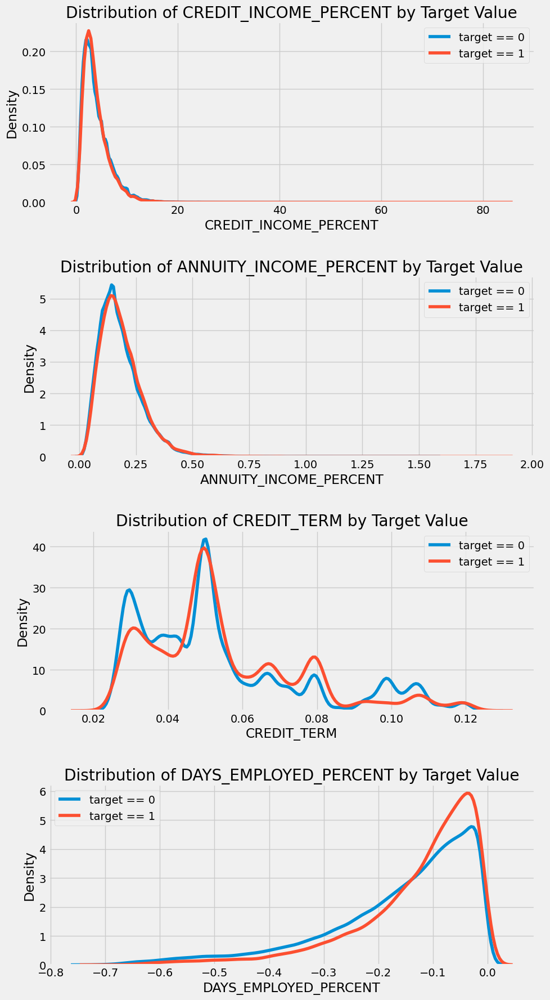

In [113]:
plt.figure(figsize = (10, 18))
# iterate through the new features
for i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):
    
    # create a new subplot for each source
    plt.subplot(4, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature); plt.ylabel('Density');
    
    plt.legend()
    
plt.tight_layout(h_pad = 2.5)

It's hard to say ahead of time if these new features will be useful. The only way to tell for sure is to try them out!

#### Ajout de variables complémentaires provenant d'autres tables

#### Variable 1 : Counts of a client's previous loans

In [91]:
bureau = pd.read_csv("C:/Users/guill/Imane/P7/data/bureau.csv")
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [92]:
# Groupby the client id (SK_ID_CURR), count the number of previous loans, and rename the column
previous_loan_counts = bureau.groupby('SK_ID_CURR', as_index=False)['SK_ID_BUREAU'].count().rename(columns = {'SK_ID_BUREAU': 'previous_loan_counts'})
previous_loan_counts.head()

,SK_ID_CURR,previous_loan_counts
0,100001,7
1,100002,8
2,100003,4
3,100004,2
4,100005,3


In [93]:
previous_loan_counts.shape

(305811, 2)

In [94]:
app_train_domain = app_train_domain.merge(previous_loan_counts, on = 'SK_ID_CURR', how = 'left')

# Fill the missing values with 0 
app_train_domain['previous_loan_counts'] = app_train_domain['previous_loan_counts'].fillna(0)
app_train_domain.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,EXT_SOURCE_3^2 DAYS_BIRTH,EXT_SOURCE_3 DAYS_BIRTH^2,DAYS_BIRTH^3,TARGET,DAYS_BIRTH,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,previous_loan_counts
0,100002,0,0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,183.785678,1.247560e+07,8.468590e+11,1,9461,2.007889,0.121978,0.060749,-0.067329,8.0
1,100003,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,4803.518937,1.504475e+08,4.712058e+12,0,16765,4.790750,0.132217,0.027598,-0.070862,4.0
2,100004,1,1,1,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,10137.567875,2.646504e+08,6.908939e+12,0,19046,2.000000,0.100000,0.050000,-0.011814,2.0
3,100006,0,0,1,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,5445.325225,1.933364e+08,6.864416e+12,0,19005,2.316167,0.219900,0.094941,-0.159905,0.0
4,100007,0,0,1,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,5710.929881,2.126570e+08,7.918677e+12,0,19932,4.222222,0.179963,0.042623,-0.152418,1.0


In [95]:
app_test_domain = app_test_domain.merge(previous_loan_counts, on = 'SK_ID_CURR', how = 'left')

# Fill the missing values with 0 
app_test_domain['previous_loan_counts'] = app_test_domain['previous_loan_counts'].fillna(0)

In [96]:
# Sauvegarde des df

app_train_domain.to_csv('app_train_domain.csv', index=False)
app_test_domain.to_csv('app_test_domain.csv', index=False)

In [98]:
train_labels = app_train['TARGET']

In [99]:
train_labels.head()

0    1
1    0
2    0
3    0
4    0
Name: TARGET, dtype: int64

In [100]:
# On remet la colonne "TARGET" dans nos df train

app_train['TARGET'] = train_labels.values
app_train_domain['TARGET'] = train_labels.values
app_train_poly['TARGET'] = train_labels.values

In [ ]:
# Sauvegarde des df

app_train.to_csv('app_train.csv', index=False)
app_train_domain.to_csv('app_train_domain.csv', index=False)
app_train_poly.to_csv('app_train_poly.csv', index=False)

In [102]:
# Sauvegarde du df avec variables polynomiales et métiers

app_train_domain.to_csv('app_train_domain.csv', index=False)

#### Feature selection with Probe method (using Light GBM)

In [44]:
gbm_probe = ProbeFeatureSelection(
    estimator=lgb.LGBMClassifier(),
    scoring="roc_auc",
    n_probes=1,
    distribution="uniform",
    cv=3,
    random_state=150,
)

X_gbm = gbm_probe.fit_transform(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 13240, number of negative: 150765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.305801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21703
[LightGBM] [Info] Number of data points in the train set: 164005, number of used features: 144
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432480
[LightGBM] [Info] Start training from score -2.432480
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 13240, number of negative: 150765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 21776
[LightGBM

In [45]:
# On crée un dictionnaire avec les importances des features 

dict(round(gbm_probe.feature_importances_, 3))
{k: round(v, 3) for k, v in sorted(gbm_probe.feature_importances_.items(), key=lambda item: -item[1])}

{'CREDIT_TERM': 279.0,
 'DAYS_BIRTH_x': 89.667,
 'DAYS_ID_PUBLISH': 87.333,
 'DAYS_EMPLOYED_PERCENT': 86.0,
 'AMT_ANNUITY': 85.333,
 'EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3': 84.333,
 'EXT_SOURCE_1_x': 84.0,
 'AMT_CREDIT': 79.333,
 'EXT_SOURCE_3_x': 75.333,
 'AMT_GOODS_PRICE': 74.667,
 'DAYS_REGISTRATION': 74.0,
 'DAYS_EMPLOYED': 73.667,
 'DAYS_LAST_PHONE_CHANGE': 67.333,
 'OWN_CAR_AGE': 61.0,
 'ANNUITY_INCOME_PERCENT': 61.0,
 'CREDIT_INCOME_PERCENT': 58.333,
 'SK_ID_CURR': 54.667,
 'previous_loan_counts': 52.0,
 'uniform_probe_0': 47.0,
 'AMT_INCOME_TOTAL': 41.0,
 'EXT_SOURCE_1 EXT_SOURCE_3 DAYS_BIRTH': 41.0,
 'EXT_SOURCE_2^2 EXT_SOURCE_3': 40.667,
 'REGION_POPULATION_RELATIVE': 39.333,
 'AMT_REQ_CREDIT_BUREAU_YEAR': 37.667,
 'EXT_SOURCE_2_x': 36.333,
 'EXT_SOURCE_2 EXT_SOURCE_3^2': 35.0,
 'EXT_SOURCE_3 DAYS_BIRTH^2': 34.333,
 'EXT_SOURCE_1 EXT_SOURCE_2^2': 31.333,
 'EXT_SOURCE_1 DAYS_BIRTH^2': 31.0,
 'EXT_SOURCE_1^2 DAYS_BIRTH': 29.333,
 'EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH': 29.333

##### Features to drop according to Light GBM based Probe method

In [46]:
gbm_probe.features_to_drop_

['NAME_CONTRACT_TYPE',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'REGION_POPULATION_RELATIVE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2_x',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',

In [47]:
# Number of columns to drop
len(gbm_probe.features_to_drop_)

131

##### Remove irrelevant features

In [ ]:
features_to_drop = gbm_probe.features_to_drop_

In [ ]:
app_train_with_feature_selection = app_train_domain.drop(features_to_drop, axis=1)

In [ ]:
app_train_with_feature_selection.to_csv('app_train_with_feature_selection.csv', index=False)

## 3. Modelisation 

#### Baseline

For a naive baseline, we could guess the same value for all examples on the testing set. We are asked to predict the probability of not repaying the loan, so if we are entirely unsure, we would guess 0.5 for all observations on the test set. 

Since we already know what score we are going to get, we don't really need to make a naive baseline guess. 

###### NB : Les trois modèles qui vont suivre ont été testé sur des jeux de données différents :
 - avec / sans variables polynomiales
 - avec / sans variables métiers
 - avec / sans feature selection
###### Bilan : 
 1) inclure des variables polynomiales et métiers permet d’accroître les performances du modèles
 
 2) réduire la dimensionnalité du dataset (après utilisation de la méthode Probe) n’impacte pas significativement les performances du modèle

#### Datasets

In [6]:
app_train = pd.read_csv("C:/Users/guill/Imane/P7/app_train.csv") 
app_train_domain = pd.read_csv("C:/Users/guill/Imane/P7/app_train_domain.csv")
app_train_poly = pd.read_csv("C:/Users/guill/Imane/P7/app_train_poly.csv")

In [6]:
train_data = app_train_domain.copy()
test_data = app_test_domain.copy()

In [3]:
# Dataset with feature selection (only 150 features)
app_train_with_feature_selection = pd.read_csv("C:/Users/guill/Imane/P7/app_train_with_feature_selection.csv")
train_data = app_train_with_feature_selection.copy()

#### Class imbalance problem

In [4]:
# Pour traiter le problème des classes déséquilibrées, on peut essayer d'utiliser la pipeline de la librairie imblearn

In [22]:
# Target
labels = train_data['TARGET']
        
# Drop the target from the training data
train = train_data.drop(columns=['TARGET'])

# Split the training data for validation
X_train, X_valid, y_train, y_valid = train_test_split(train, labels, test_size=0.2, stratify=labels, random_state=42)
        
# Create a pipeline for imputation & scaling
preprocessor = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', MinMaxScaler(feature_range=(0, 1)))])

In [23]:
# Use RandomUnderSampler

sample = RandomUnderSampler(random_state=1944)

# Fit and apply the transform
X_under, y_under = sample.fit_resample(X_train, y_train) # Resample is used only on the training data, not on the validation data.


print("y_train : ", y_train.value_counts())
print(" ")
print("y_under : ", y_under.value_counts())

y_train :  TARGET
0    226148
1     19860
Name: count, dtype: int64
 
y_under :  TARGET
0    19860
1    19860
Name: count, dtype: int64


#### Business score

###### The F2-measure is an example of the Fbeta-measure with a beta value of 2.0.

It has the effect of lowering the importance of precision and increase the importance of recall.

If maximizing precision minimizes false positives, and maximizing recall minimizes false negatives, then the F2-measure puts more attention on minimizing false negatives than minimizing false positives.

Here, we want to give 10 times more importance to recall (which minimizes false negatives).

The relative weighting of recall compared to precision is given by 𝛽^2.

According to the F-beta score formula, 𝛽^2 = 10 <=> 𝛽 = square root of 10 <=> 𝛽 ≈ 3.16

In [24]:
# Define the F2-score

# Fonction pour trouver le seuil optimal pour maximiser le F2-score
def find_optimal_threshold(y_true, y_pred_prob, beta=3.16):
    """
    y_true: true values of the target class (1)
    y_pred_prob: predicted probabilities by the model for the positive class
    How it works:
    - Uses the roc_curve function to calculate false positive rates (fpr), true positive rates (tpr), and decision thresholds from the predicted probabilities.
    - Calculates the F2-score for each decision threshold using fbeta_score with beta=3.16.
    - Selects the threshold that maximizes the F2-score and returns it as the optimal threshold.
    """
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob) # Compute false positive rates, true positive rates, and decision thresholds
    fbeta_scores = [fbeta_score(y_true, (y_pred_prob >= t).astype(int), beta=beta) for t in thresholds] # Compute fbeta for each threshold
    optimal_threshold = thresholds[np.argmax(fbeta_scores)] # Optimal threshold maximizing fbeta
    print(f"Optimal Threshold: {optimal_threshold}")
    return optimal_threshold

# Scorer personnalisé pour le F2-score avec optimisation du seuil
def f2_score_with_optimal_threshold(y_true, y_pred_prob, optimal_threshold, beta=3.16):
    """"
    How it works:
    - Applies the optimal decision threshold to the predicted probabilities to obtain binary predictions (y_pred_optimal)
    - Calculates the F2-score using fbeta_score with beta=3.16 between the true values (y_true) and the optimal predictions (y_pred_optimal).
    """
    y_pred_optimal = (y_pred_prob >= optimal_threshold).astype(int)
    return fbeta_score(y_true, y_pred_optimal, beta=beta)

# Create a custom make_scorer
optimal_threshold = None  # We will obtain it from the training process
f2_score = make_scorer(f2_score_with_optimal_threshold, needs_proba=True, optimal_threshold=optimal_threshold, beta=3.16) # Crée un scoreur qui utilise la fonction f2_score_with_optimal_threshold avec les paramètres spécifiés (needs_proba=True indiquant que le modèle fournit des probabilités plutôt que des prédictions binaires directes)

## Logistic Regression

In [33]:
# On fit transform pipeline_preprocessor sur X_train
preprocessor.fit_transform(X_under)
        
# On définit le classifier
log_reg_clf = LogisticRegression(random_state=42, max_iter=500, class_weight='balanced')
        
# On combine preprocessor et log_reg_clf en une pipeline
pipe_log_reg = Pipeline([
    ('preprocessor', preprocessor), 
    ('classifier', log_reg_clf)
])
        
# Define the parameter grid for GridSearchCV
param_grid = {
    "classifier__C": [0.001, 0.01, 0.1], # Une régularisation + forte (faible valeur de C) peut aider à réduire l'overfitting
    "classifier__penalty": ['l1', 'l2'], 
    "classifier__solver": ['liblinear', 'saga']
}
        
# Define the GridSearchCV
pipe_gscv = GridSearchCV(pipe_log_reg,
                         param_grid=param_grid,
                         scoring={"accuracy": "accuracy", "f1": "f1", "roc_auc": "roc_auc", "f2": f2_score},
                         refit="roc_auc", # Après avoir évalué les modèles sur les différentes métriques de scoring, GridSearchCV réajuste le meilleur modèle (en termes de roc_auc) sur l'ensemble de données complet.
                         cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42), 
                         n_jobs=5, 
                         verbose=1)

# Entraînement de GridSearchCV sur les données d'entraînement
pipe_gscv.fit(X_under, y_under)
        
# Get the best model
best_model = pipe_gscv.best_estimator_

# Obtenir les prédictions de probabilité sur les données d'entraînement
y_pred_prob_train = best_model.predict_proba(X_under)[:, 1]

# Calculer le seuil optimal sur les données d'entraînement
optimal_threshold_train = find_optimal_threshold(y_under, y_pred_prob_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Optimal Threshold: 0.07825243534741644


In [13]:
gscv_results = pd.DataFrame(pipe_gscv.cv_results_)
gscv_results

# Pour le temps d'entraînement des modèles, regarder la colonne mean_fit_time

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__C,param_classifier__penalty,param_classifier__solver,params,split0_test_accuracy,split1_test_accuracy,...,std_test_roc_auc,rank_test_roc_auc,split0_test_f2,split1_test_f2,split2_test_f2,split3_test_f2,split4_test_f2,mean_test_f2,std_test_f2,rank_test_f2
0,10.233459,0.098050,0.990277,0.063958,0.001,l1,liblinear,"{'classifier__C': 0.001, 'classifier__penalty'...",0.500000,0.506798,...,0.005738,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,10.177261,0.225261,0.885448,0.167080,0.001,l1,saga,"{'classifier__C': 0.001, 'classifier__penalty'...",0.641868,0.652442,...,0.006416,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,5.654379,0.180914,1.003359,0.117459,0.001,l2,liblinear,"{'classifier__C': 0.001, 'classifier__penalty'...",0.677744,0.672583,...,0.006124,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,9.343326,0.203115,0.824560,0.100795,0.001,l2,saga,"{'classifier__C': 0.001, 'classifier__penalty'...",0.675856,0.672331,...,0.006274,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,7.329797,0.343908,0.954056,0.024725,0.010,l1,liblinear,"{'classifier__C': 0.01, 'classifier__penalty':...",0.676234,0.670317,...,0.005964,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
5,33.050617,9.444137,0.750803,0.092530,0.010,l1,saga,"{'classifier__C': 0.01, 'classifier__penalty':...",0.674975,0.670317,...,0.006060,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
6,4.514103,0.351824,0.734041,0.056585,0.010,l2,liblinear,"{'classifier__C': 0.01, 'classifier__penalty':...",0.677115,0.678248,...,0.005450,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
7,11.530224,0.496572,0.896253,0.146684,0.010,l2,saga,"{'classifier__C': 0.01, 'classifier__penalty':...",0.675982,0.677618,...,0.005482,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
8,17.823056,1.927387,0.880818,0.102331,0.100,l1,liblinear,"{'classifier__C': 0.1, 'classifier__penalty': ...",0.680514,0.681772,...,0.005051,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
9,98.501610,48.304903,0.585323,0.135295,0.100,l1,saga,"{'classifier__C': 0.1, 'classifier__penalty': ...",0.680514,0.680891,...,0.005032,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


#### Scores

In [143]:
# Prédire sur le set de validation externe
y_pred = best_model.predict(X_valid)

# Prédire les probabilités sur l'ensemble de validation
y_valid_pred_prob = best_model.predict_proba(X_valid)[:, 1]

# Calculer le ROC AUC sur l'ensemble de validation
roc_auc_valid = roc_auc_score(y_valid, y_valid_pred_prob)
print(f"Final ROC-AUC on validation data: {roc_auc_valid}")

# Calculer l'accuracy sur l'ensemble de validation avec les prédictions initiales
accuracy_initial = accuracy_score(y_valid, y_pred)
print(f"Accuracy on validation data with initial threshold: {accuracy_initial}")

optimal_threshold = 0.07825243534741644 # On complète avec le seuil optimal trouvé + haut

# Prédire les classes sur l'ensemble de validation avec le seuil optimal
# Supposons que `predict` renvoie déjà les classes pour ce cas
y_pred_optimal = (y_valid_pred_prob >= optimal_threshold).astype(int)

# Calculer l'accuracy avec le seuil optimal
accuracy_optimal = accuracy_score(y_valid, y_pred_optimal)
print(f"Accuracy on validation data with optimal threshold: {accuracy_optimal}")

# Calculer le score F2 sur l'ensemble de validation
f2_score_val = fbeta_score(y_valid, y_pred_optimal, beta=3.16)
print(f"F2 Score on validation data: {f2_score_val}")

Final ROC-AUC on validation data: 0.7495276087517287
Accuracy on validation data with initial threshold: 0.6827959611726258
Accuracy on validation data with optimal threshold: 0.09150773133017902
F2 Score on validation data: 0.493789591266017


NB : Pour calculer le **ROC AUC**, il est important d'utiliser les **probabilités** de prédiction plutôt que les classes prédites. Le ROC AUC est basé sur les scores de probabilité et non sur les décisions binaires.

#### Graphical representation

In [ ]:
# Créer une matrice de confusion
conf_matrix = confusion_matrix(y_valid, y_pred)

# Afficher la matrice de confusion avec Seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculer et tracer la courbe ROC
fpr, tpr, thresholds = roc_curve(y_valid, y_valid_pred_prob)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_valid:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

### Tracking experiments with MLFlow

In [20]:
# Automatic discovery : if MLFlow has been launched before Jupyter
if "MLFLOW_TRACKING_URI" in os.environ:
    print(os.environ["MLFLOW_TRACKING_URI"])
else:
    print("MLflow was not automatically discovered, a tracking URI must be provided manually.")

http://127.0.0.1:5000


In [19]:
# Manual setting 
os.environ["MLFLOW_TRACKING_URI"] = "http://127.0.0.1:5000"

In [24]:
def log_gsvc_to_mlflow(gscv, mlflow_experiment_name):
    """Log a scikit-learn trained GridSearchCV object as an MLflow experiment."""
     # Set up MLFlow context
    mlflow.set_experiment(experiment_name=mlflow_experiment_name)

    for run_idx in range(len(gscv.cv_results_["params"])):
        # For each hyperparameter combination we trained the model with, we log a run in MLflow
        run_name = f"run_log_reg {run_idx}" # Modifying the run_name according to the model used

        with mlflow.start_run(run_name=run_name):
            # Log hyperparameters
            params = gscv.cv_results_["params"][run_idx]
            for param in params:
                mlflow.log_param(param, params[param])

            # Log fit metrics
            scores = [score for score in gscv.cv_results_ if "mean_test" in score or "std_test" in score]
            for score in scores:
                mlflow.log_metric(score, gscv.cv_results_[score][run_idx])

            # Log model as an artifact
            mlflow.sklearn.log_model(gscv, "gscv_model")

            # Log training data URL
            mlflow.log_param("data_url", "C:/Users/guill/Imane/P7/app_train.csv")

In [ ]:
# Modifying the mlflow_experiment_name according to the model used
log_gsvc_to_mlflow(gscv=pipe_gscv, mlflow_experiment_name="Logistic Regression") 

#### Loading models with MLFlow

In [ ]:
# Log the best model separately
best_model = gscv.best_estimator_
with mlflow.start_run(run_name="best_model", nested=True):
    # Log the best model hyperparameters
    best_params = gscv.best_params_
    for param in best_params:
        mlflow.log_param(param, best_params[param])
        
    # Log model as an artifact
    mlflow.sklearn.log_model(best_model, "best_model")

    # Optionally, you can log any other relevant metrics for the best model
    mlflow.log_metric("best_score", gscv.best_score_)

    # Log training data URL
    mlflow.log_param("data_url", "C:/Users/guill/Imane/P7/app_train.csv")

    # Register the model
    model_uri = f"runs:/{mlflow.active_run().info.run_id}/best_model"
    mlflow.register_model(model_uri, "best_model_random_forest") # Modifying the model_name according to the model used

## Random Forest

To avoid overfitting, we aim to simplify our models (e.g., by selecting less complex hyperparameters).

In [31]:
# Définition du classifier Random Forest
rf_clf = RandomForestClassifier(random_state=42)

# Création de la pipeline
pipe_rf = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', rf_clf)
])

# Définition de la grille de paramètres pour GridSearchCV
param_grid = {
    "classifier__n_estimators": [50, 100],  # Nombre d'arbres dans la forêt
    "classifier__max_depth": [5, 10],  # Profondeur maximale des arbres
    "classifier__min_samples_split": [5, 10],  # Nombre minimum d'échantillons requis pour diviser un nœud
    "classifier__min_samples_leaf": [2, 4],  # Nombre minimum d'échantillons requis à chaque nœud feuille
    "classifier__bootstrap": [True],  # Utiliser le bootstrap pour échantillonner les données
    "classifier__criterion": ["entropy"],  # Critère de division des arbres
    "classifier__class_weight": ["balanced", {0: 1, 1: 10}]
}

# Définition de GridSearchCV
pipe_gscv = GridSearchCV(pipe_rf,
                         param_grid=param_grid,
                         scoring={"accuracy": "accuracy", "f1": "f1", "roc_auc": "roc_auc", "f2": f2_score},
                         refit="roc_auc",
                         cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
                         n_jobs=5,
                         verbose=1)

# Entraînement de GridSearchCV sur les données d'entraînement
pipe_gscv.fit(X_under, y_under)

# Obtention du meilleur modèle
best_model = pipe_gscv.best_estimator_

# Obtenir les prédictions de probabilité sur les données d'entraînement
y_pred_prob_train = best_model.predict_proba(X_under)[:, 1]

# Calculer le seuil optimal sur les données d'entraînement
optimal_threshold_train = find_optimal_threshold(y_under, y_pred_prob_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits
Optimal Threshold: 0.22153431424002296


In [159]:
gscv_results = pd.DataFrame(pipe_gscv.cv_results_)
gscv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__bootstrap,param_classifier__class_weight,param_classifier__criterion,param_classifier__max_depth,param_classifier__min_samples_leaf,param_classifier__min_samples_split,...,std_test_roc_auc,rank_test_roc_auc,split0_test_f2,split1_test_f2,split2_test_f2,split3_test_f2,split4_test_f2,mean_test_f2,std_test_f2,rank_test_f2
0,13.340546,0.165264,0.701092,0.100339,True,balanced,entropy,5,2,5,...,0.006485,24,0.915952,0.915432,0.916971,0.915374,0.915682,0.915882,0.000582,19
1,20.601666,0.289854,0.813077,0.117948,True,balanced,entropy,5,2,5,...,0.006013,22,0.916394,0.915162,0.916721,0.915297,0.915490,0.915813,0.000626,22
2,15.938674,0.199910,1.088219,0.478519,True,balanced,entropy,5,2,10,...,0.006513,28,0.916183,0.915259,0.916913,0.915393,0.915548,0.915859,0.000615,20
3,25.713263,0.313403,1.154312,0.283917,True,balanced,entropy,5,2,10,...,0.005980,25,0.916356,0.915432,0.916740,0.915374,0.915625,0.915905,0.000545,18
4,15.397031,0.606315,0.726353,0.127383,True,balanced,entropy,5,4,5,...,0.006424,30,0.915990,0.915297,0.916952,0.915413,0.915509,0.915832,0.000607,21
5,23.758009,0.349312,0.793033,0.106654,True,balanced,entropy,5,4,5,...,0.005924,27,0.916163,0.915239,0.916721,0.915297,0.915605,0.915805,0.000563,23
6,13.616371,0.097001,0.661724,0.078886,True,balanced,entropy,5,4,10,...,0.006451,29,0.915952,0.914854,0.916913,0.915567,0.915567,0.915771,0.000672,24
7,20.460070,0.202308,1.022455,0.273413,True,balanced,entropy,5,4,10,...,0.005933,26,0.916548,0.915432,0.916721,0.915413,0.915682,0.915959,0.000562,17
8,32.835979,0.561818,0.825452,0.025466,True,balanced,entropy,10,2,5,...,0.006469,6,0.914620,0.913617,0.914620,0.911617,0.910668,0.913028,0.001611,32
9,42.551594,0.391030,1.236816,0.191798,True,balanced,entropy,10,2,5,...,0.006201,4,0.912280,0.913849,0.916514,0.912489,0.911077,0.913242,0.001857,30


#### Scores

In [163]:
# Prédire sur le set de validation externe
y_pred = best_model.predict(X_valid)

# Prédire les probabilités sur l'ensemble de validation
y_valid_pred_prob = best_model.predict_proba(X_valid)[:, 1]

# Calculer le ROC AUC sur l'ensemble de validation
roc_auc_valid = roc_auc_score(y_valid, y_valid_pred_prob)
print(f"Final ROC-AUC on validation data: {roc_auc_valid}")

# Calculer l'accuracy sur l'ensemble de validation avec les prédictions initiales
accuracy_initial = accuracy_score(y_valid, y_pred)
print(f"Accuracy on validation data with initial threshold: {accuracy_initial}")

optimal_threshold = 0.22153431424002296 # On complète avec le seuil optimal trouvé + haut

# Prédire les classes sur l'ensemble de validation avec le seuil optimal
# Supposons que `predict` renvoie déjà les classes pour ce cas
y_pred_optimal = (y_valid_pred_prob >= optimal_threshold).astype(int)

# Calculer l'accuracy avec le seuil optimal
accuracy_optimal = accuracy_score(y_valid, y_pred_optimal)
print(f"Accuracy on validation data with optimal threshold: {accuracy_optimal}")

# Calculer le score F2 sur l'ensemble de validation
f2_score_val = fbeta_score(y_valid, y_pred_optimal, beta=3.16)
print(f"F2 Score on validation data: {f2_score_val}")

Final ROC-AUC on validation data: 0.7385256881655262
Accuracy on validation data with initial threshold: 0.676845031949661
Accuracy on validation data with optimal threshold: 0.20607124855698097
F2 Score on validation data: 0.514830948006927


#### Graphical representation

In [ ]:
# Créer une matrice de confusion
conf_matrix = confusion_matrix(y_valid, y_pred)

# Afficher la matrice de confusion avec Seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculer et tracer la courbe ROC
fpr, tpr, thresholds = roc_curve(y_valid, y_valid_pred_prob)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_valid:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

#### Tracking experiments and loading best Random Forest model with MLFlow above.

## Light GBM

With app_train_with_feature_selection (150 features)

In [58]:
# Définition du classifier LightGBM
lgb_clf = lgb.LGBMClassifier(random_state=42)

# Création de la pipeline
pipe_lgb = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', lgb_clf)
])

# Définition de la grille de paramètres réduite
param_grid = {
    "classifier__n_estimators": [50, 100, 150],  # Nombre d'arbres dans le modèle
    "classifier__learning_rate": [0.01, 0.1],  # Taux d'apprentissage
    "classifier__max_depth": [5, 7],  # Profondeur maximale des arbres
    "classifier__subsample": [0.8, 1.0],  # Fraction des données à utiliser pour chaque arbre
    "classifier__reg_alpha": [0.1],  # Régularisation L1
    "classifier__reg_lambda": [0.1],  # Régularisation L2
    "classifier__objective" : ['binary'],
    "classifier__class_weight" : ['balanced'],
}

# Création de RandomizedSearchCV
pipe_rscv = RandomizedSearchCV(pipe_lgb,
                         param_distributions=param_grid,
                         scoring={"accuracy": "accuracy", "f1": "f1", "roc_auc": "roc_auc", "f2": f2_score},
                         refit="roc_auc",
                         n_iter=20,  # Nombre de combinaisons aléatoires à tester
                         cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
                         n_jobs=5,
                         verbose=1)

# Entraînement de RandomizedSearchCV sur les données d'entraînement
pipe_rscv.fit(X_under, y_under)

# Obtention du meilleur modèle
best_model = pipe_rscv.best_estimator_

# Obtenir les prédictions de probabilité sur les données d'entraînement
y_pred_prob_train = best_model.predict_proba(X_under)[:, 1]

# Calculer le seuil optimal sur les données d'entraînement
optimal_threshold_train = find_optimal_threshold(y_under, y_pred_prob_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[LightGBM] [Info] Number of positive: 19860, number of negative: 19860
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.082563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20996
[LightGBM] [Info] Number of data points in the train set: 39720, number of used features: 259
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Optimal Threshold: 0.1829979058490764


In [45]:
rscv_results = pd.DataFrame(pipe_rscv.cv_results_)
rscv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__subsample,param_classifier__reg_lambda,param_classifier__reg_alpha,param_classifier__objective,param_classifier__n_estimators,param_classifier__max_depth,...,std_test_roc_auc,rank_test_roc_auc,split0_test_f2,split1_test_f2,split2_test_f2,split3_test_f2,split4_test_f2,mean_test_f2,std_test_f2,rank_test_f2
0,15.204237,2.168546,0.605908,0.074103,1.0,0.1,0.1,binary,150,5,...,0.005819,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,16.066372,0.684257,0.625540,0.085957,0.8,0.1,0.1,binary,150,7,...,0.006214,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,11.455913,1.773777,0.572001,0.047725,0.8,0.1,0.1,binary,100,7,...,0.006575,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,9.780027,1.192441,0.500597,0.024107,1.0,0.1,0.1,binary,100,5,...,0.006043,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,12.256383,0.805024,0.548187,0.049589,1.0,0.1,0.1,binary,150,5,...,0.005879,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
5,12.467347,0.734215,0.475301,0.029595,1.0,0.1,0.1,binary,100,7,...,0.005703,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
6,13.068642,1.039211,0.536346,0.029550,1.0,0.1,0.1,binary,150,7,...,0.006024,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
7,14.308578,1.368241,0.583067,0.071791,0.8,0.1,0.1,binary,150,7,...,0.006024,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
8,7.379951,1.333652,0.440624,0.029168,0.8,0.1,0.1,binary,50,5,...,0.005643,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
9,9.038683,0.700818,0.454828,0.018188,1.0,0.1,0.1,binary,50,7,...,0.005951,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


#### Scores

In [67]:
# Prédire sur le set de validation externe
y_pred = best_model.predict(X_valid)

# Prédire les probabilités sur l'ensemble de validation
y_valid_pred_prob = best_model.predict_proba(X_valid)[:, 1]

# Calculer le ROC AUC sur l'ensemble de validation
roc_auc_valid = roc_auc_score(y_valid, y_valid_pred_prob)
print(f"Final ROC-AUC on validation data: {roc_auc_valid}")

# Calculer l'accuracy sur l'ensemble de validation avec les prédictions initiales
accuracy_initial = accuracy_score(y_valid, y_pred)
print(f"Accuracy on validation data with initial threshold: {accuracy_initial}")

optimal_threshold = 0.1829979058490764 # On complète avec le seuil optimal trouvé + haut

# Prédire les classes sur l'ensemble de validation avec le seuil optimal
# Supposons que `predict` renvoie déjà les classes pour ce cas
y_pred_optimal = (y_valid_pred_prob >= optimal_threshold).astype(int)

# Calculer l'accuracy avec le seuil optimal
accuracy_optimal = accuracy_score(y_valid, y_pred_optimal)
print(f"Accuracy on validation data with optimal threshold: {accuracy_optimal}")

# Calculer le score F2 sur l'ensemble de validation
f2_score_val = fbeta_score(y_valid, y_pred_optimal, beta=3.16)
print(f"F2 Score on validation data: {f2_score_val}")

Final ROC-AUC on validation data: 0.7635807901766075
Accuracy on validation data with initial threshold: 0.6932344763670065
Accuracy on validation data with optimal threshold: 0.22439555794026309
F2 Score on validation data: 0.5226648792615475


#### Graphical representation

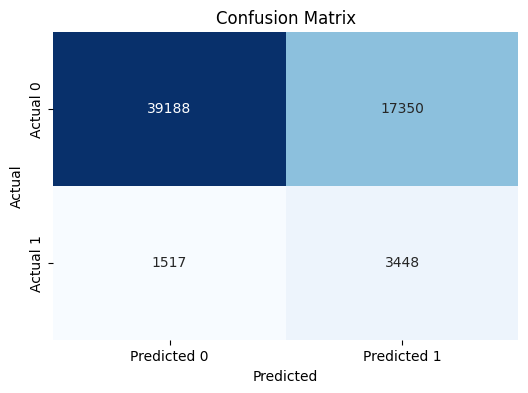

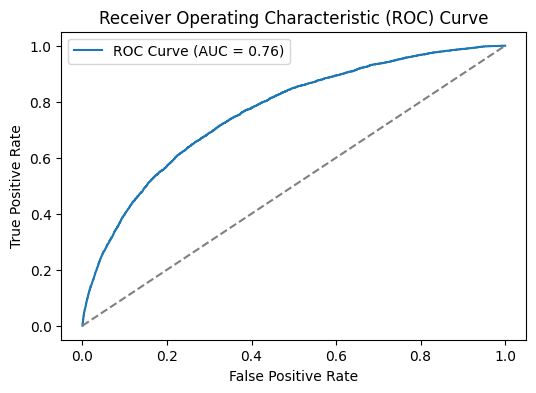

In [24]:
# Créer une matrice de confusion
conf_matrix = confusion_matrix(y_valid, y_pred)

# Afficher la matrice de confusion avec Seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculer et tracer la courbe ROC
fpr, tpr, thresholds = roc_curve(y_valid, y_valid_pred_prob)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_valid:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

#### Tracking experiments with MLFlow

In [59]:
def log_rscv_to_mlflow(rscv, mlflow_experiment_name):
    """Log a scikit-learn trained GridSearchCV object as an MLflow experiment."""
     # Set up MLFlow context
    mlflow.set_experiment(experiment_name=mlflow_experiment_name)

    for run_idx in range(len(rscv.cv_results_["params"])):
        # For each hyperparameter combination we trained the model with, we log a run in MLflow
        run_name = f"run_light_gbm {run_idx}"
        with mlflow.start_run(run_name=run_name):
            # Log hyperparameters
            params = rscv.cv_results_["params"][run_idx]
            for param in params:
                mlflow.log_param(param, params[param])

            # Log fit metrics
            scores = [score for score in rscv.cv_results_ if "mean_test" in score or "std_test" in score]
            for score in scores:
                mlflow.log_metric(score, rscv.cv_results_[score][run_idx])

            # Log model as an artifact
            mlflow.sklearn.log_model(rscv, "rscv_model")

            # Log training data URL
            mlflow.log_param("data_url", "C:/Users/guill/Imane/P7/app_train_with_feature_selection.csv")

In [60]:
log_rscv_to_mlflow(rscv=pipe_rscv, mlflow_experiment_name="Light GBM with feature selection")

2024/07/18 10:27:46 INFO mlflow.tracking.fluent: Experiment with name 'Light GBM with feature selection' does not exist. Creating a new experiment.


#### Best model : Light GBM

## 4. Global and local analysis of feature importance

With app_train_with_feature_selection (150 features)

### SHAP

In [206]:
# Obtention du meilleur modèle 
best_model = pipe_rscv.best_estimator_

# Extraction du classificateur entraîné (meilleur estimateur) de la pipeline
best_classifier = best_model.named_steps['classifier']

In [215]:
# TreeExplainer is designed for tree-based models such as LightGBM. 
# It uses a specific method to compute SHAP values, tailored to the characteristics of LightGBM's decision trees.

explainer = shap.TreeExplainer(best_classifier) 

# On obtient les valeurs SHAP sur notre ensemble de données de validation
shap_values = explainer(X_valid)

#### Mean Absolute SHAP Plot

In [199]:
# Conversion des valeurs SHAP en DataFrame pour une manipulation plus facile
shap_values_df = pd.DataFrame(shap_values.values, columns=X_valid.columns)

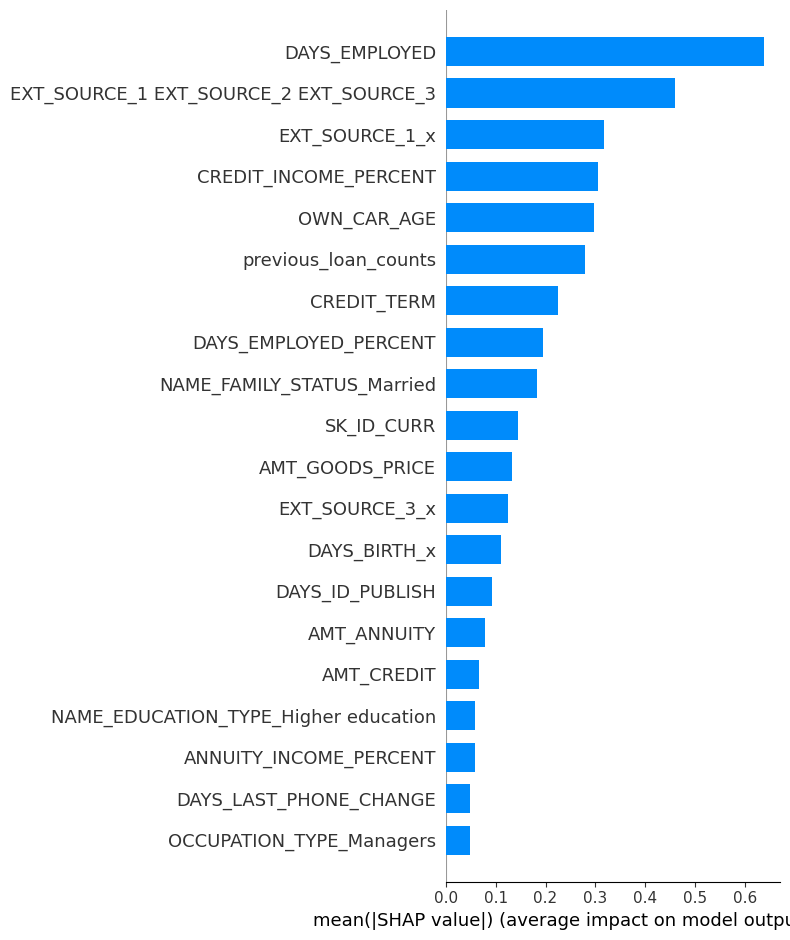

In [186]:
# Calcul des valeurs SHAP moyennes absolues pour chaque caractéristique
mean_abs_shap_values = shap_values_df.abs().mean().sort_values(ascending=False)

# Création du graphique des valeurs SHAP moyennes absolues
shap.summary_plot(shap_values, X_valid, plot_type="bar")

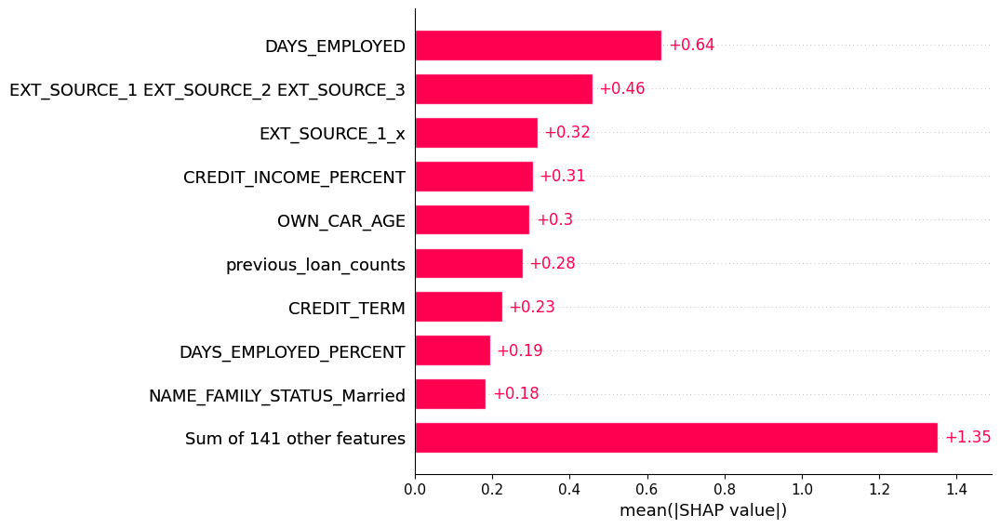

In [188]:
shap.plots.bar(shap_values)

#### Beeswarm plot

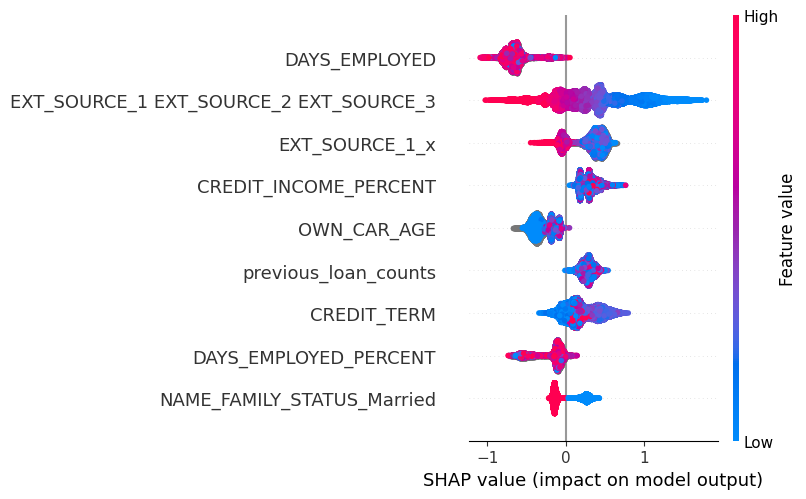

In [189]:
# Résumé de l'importance des caractéristiques
shap.summary_plot(shap_values, X_valid, max_display = 9)

#### Top 20 most important features

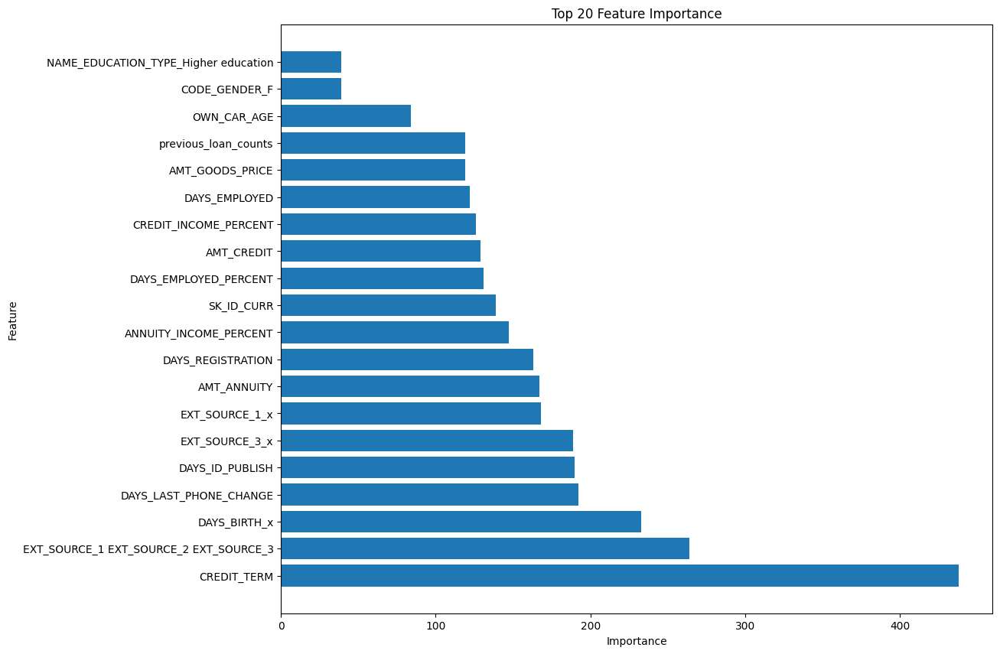

In [122]:
column_names = X_valid.columns.tolist()

feature_importance = best_estimator.feature_importances_
sorted_idx = np.argsort(feature_importance)[::-1]  # Tri décroissant
top_20_idx = sorted_idx[:20]  # Sélection des 20 premières caractéristiques

# Tracer les caractéristiques importantes
pos = np.arange(len(top_20_idx)) + 0.5
plt.figure(figsize=(12, 10))
plt.barh(pos, feature_importance[top_20_idx], align="center")
plt.yticks(pos, np.array(column_names)[top_20_idx], rotation='horizontal')
plt.title("Top 20 Feature Importance")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

#### Waterfall Plot (feature local importance)

##### Client observation_idx = 654

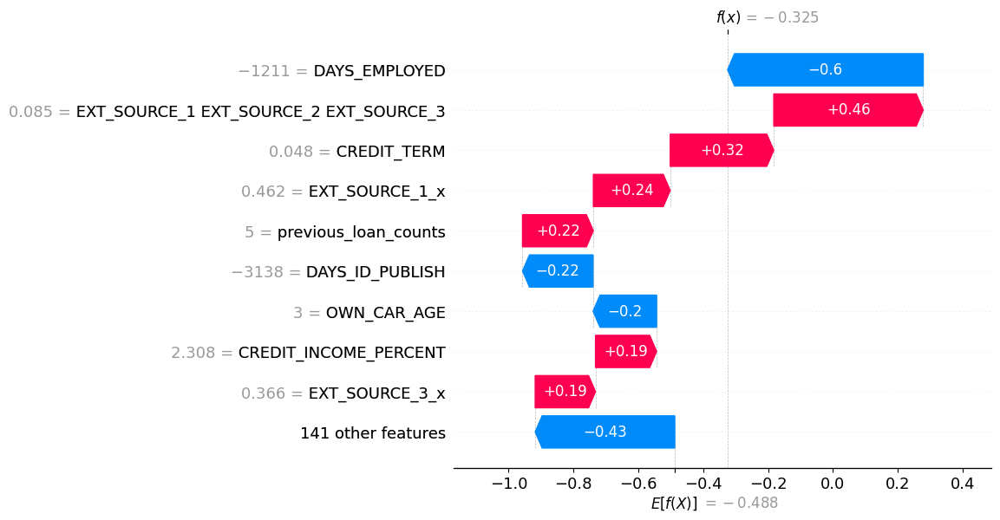

In [205]:
# Sélection d'une observation spécifique 
observation_idx = 654
shap_values_single = shap_values[observation_idx]

# Création du graphique en cascade pour cette observation
shap.waterfall_plot(shap_values_single)

##### Client observation_idx = 1460

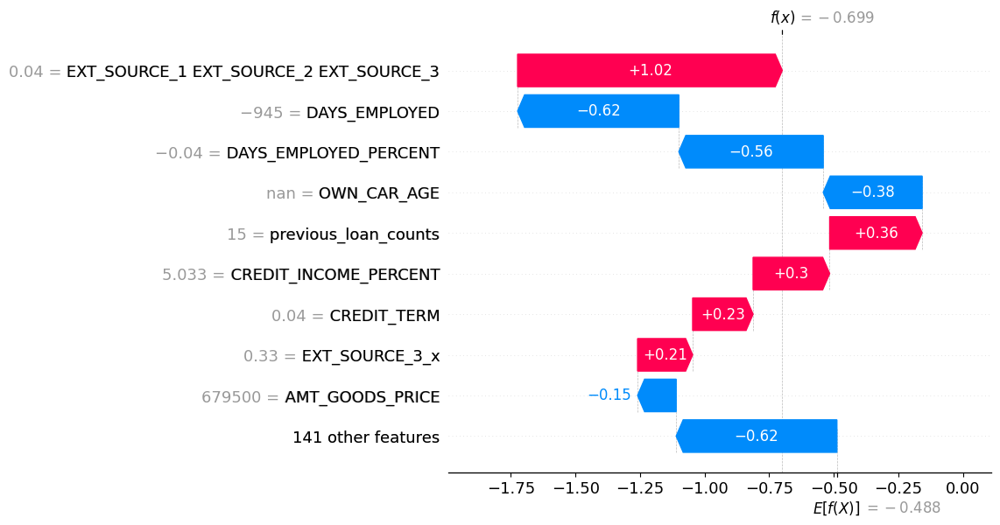

In [222]:
# Sélection d'une observation spécifique 
observation_idx = 1460
shap_values_single = shap_values[observation_idx]

# Création du graphique en cascade pour cette observation
shap.waterfall_plot(shap_values_single)

### LIME

**Local Interpretable Model-agnostic Explanations**

The color difference first shows us the features that contribute to increasing the predicted value (in orange) and those that contribute to decreasing it (in blue). 

We can see the exact value of each feature for the instance in the table on the right, but it is primarily the graph in the middle that provides the most insight into each feature's contribution to the prediction.

In [190]:
# 1. Accès aux données transformées
X_valid_transformed = pipe_lgb.named_steps['preprocessor'].transform(X_valid)

# 2. Obtention du meilleur modèle depuis RandomizedSearchCV
best_model = pipe_rscv.best_estimator_

##### Client observation_idx = 0

In [191]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_valid_transformed, mode="classification", feature_names=X_valid.columns, class_names=['0', '1'])

feature_names = X_valid.columns

# Exemple d'explication pour une observation spécifique
observation_idx = 0
explanation = explainer.explain_instance(X_valid_transformed[observation_idx], best_model.predict_proba, num_features=len(feature_names))

# Afficher l'explication
explanation.show_in_notebook()

##### Client observation_idx = 2448

In [181]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_under_transformed, mode="classification", feature_names=X_under.columns, class_names=['0', '1'])

feature_names=X_under.columns

# Exemple d'explication pour une observation spécifique
observation_idx = 2448
explanation = explainer.explain_instance(X_under_transformed[observation_idx], best_model.predict_proba, num_features=len(feature_names))

# Afficher l'explication
explanation.show_in_notebook()

##### Client observation_idx = 543

In [180]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_under_transformed, mode="classification", feature_names=X_under.columns, class_names=['0', '1'])

feature_names=X_under.columns

# Exemple d'explication pour une observation spécifique
observation_idx = 543
explanation = explainer.explain_instance(X_under_transformed[observation_idx], best_model.predict_proba, num_features=len(feature_names))

# Afficher l'explication
explanation.show_in_notebook()

##### Client observation_idx = 445

In [179]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_under_transformed, mode="classification", feature_names=X_under.columns, class_names=['0', '1'])

feature_names=X_under.columns

# Exemple d'explication pour une observation spécifique
observation_idx = 445
explanation = explainer.explain_instance(X_under_transformed[observation_idx], best_model.predict_proba, num_features=len(feature_names))

# Afficher l'explication
explanation.show_in_notebook()

##### Client observation_idx = 12345

In [182]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_under_transformed, mode="classification", feature_names=X_under.columns, class_names=['0', '1'])

feature_names=X_under.columns

# Exemple d'explication pour une observation spécifique
observation_idx = 12345
explanation = explainer.explain_instance(X_under_transformed[observation_idx], best_model.predict_proba, num_features=len(feature_names))

# Afficher l'explication
explanation.show_in_notebook()

## 5. Model deployment

#### Model Signature

Afin de garantir que les données d'entrée d'un modèle sont conformes à ce qui est attendu, les modèles MLflow peuvent inclure des metadatas décrivant les entrées et sorties :

Model Signature : description des entrées et sorties du modèle

Model Input Example : exemple d'une entrée valide

La signature du modèle permet de renseigner le nom des colonnes et leurs types afin de vérifier si ils sont similaires lors de la prédiction.

In [27]:
# Utiliser la fonction infer_signature afin d'extraire la signature à partir des données d'entrée et de sortie.

signature = infer_signature(X_train, y_train)

In [40]:
# Score et hyperparamètres de notre meilleur modèle Light GBM

pipe_rscv.best_score_, pipe_rscv.best_params_

(0.7588408005078855,
 {'classifier__subsample': 1.0,
  'classifier__reg_lambda': 0.1,
  'classifier__reg_alpha': 0.1,
  'classifier__objective': 'binary',
  'classifier__n_estimators': 150,
  'classifier__max_depth': 5,
  'classifier__learning_rate': 0.1,
  'classifier__class_weight': 'balanced'})

#### Sauvegarde du modèle sur le disque dur [SERIALISATION]

In [30]:
joblib.dump(best_model, 'best_model.joblib')

['best_model.joblib']

#### Sauvegarde du modèle sklearn

In [32]:
# Sauvegarder le pipeline à l'aide de la fonction save_model en n'oubliant pas de préciser la signature.

# Après l'entraînement de pipe_rscv
best_model = pipe_rscv.best_estimator_

mlflow.sklearn.save_model(best_model, "mlflow_model_", signature=signature)

#### Test

In [2]:
model_local_path = 'C:/Users/guill/Imane/P7/mlflow_model_'

try:
    model = mlflow.sklearn.load_model(model_local_path)
    print("Model loaded successfully.")
except Exception as e:
    print(f"Error loading model: {e}")


Model loaded successfully.


## 6. Next

En local :
- Code API 
- Déploiement de l'API en local 
- Tests unitaires 
- Test d'une application Streamlit en local
 
Pour le Cloud : 
- Stockage du modèle sur Google Cloud
- Obtention d'une URL publique pour notre API avec RENDER
- Création d'une application sur Streamlit Cloud : https://creditprediction.streamlit.app/

Lien vers GitHub : https://github.com/imanitou/P7